# Deep Convolutional Generative Adversarial Model

### Importing the required librarires

In [28]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torchvision.utils import save_image
%matplotlib inline

### Initialising the random seed used for the pseudo-random number generator. If we want our random z vector to be reprocutable we set the seed to get the deterministic random data we want.

In [29]:
manualSeed = random.randint(1, 10000)
print("Random Seed used: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  4739


### Setting the parameters. We set the directory for the images, the number of processes used for loading the dataset, the size of each batch, the size of each image which will be 64 X 64, the number of colour channels(1 for grayscale and 3 for color), the size of the latent vector given to the generator, the output size of the generator, the input size of the discriminator, the number of training cycle, the learning rate for the optimizer, coefficients used for gradient and its square and the number of GPUs available to the machine.

In [32]:
#Root directory for dataset
dataroot = "data/faces"

#Number of workers for dataloader
workers = 2

#Batch size during training
batch_size = 128

#Spatial size of training images. All images will be resized to this
#size using a transformer.
image_size = 64

#Number of channels in the training images. For color images this is 3
nc = 3

#Size of z latent vector (i.e. size of generator input)
nz = 100

#Size of feature maps in generator
ngf = 64

#Size of feature maps in discriminator
ndf = 64

#Number of training epochs
num_epochs = 5

#Learning rate for optimizers
lr = 0.0002

#Beta1 hyperparam for Adam optimizers
beta1 = 0.5

#Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

### Load the images into the array and apply the following transforms to prepare the data: the images are resized to 64 by 64, cropped at the center, normalised each colour channel(red blue green) for each pixel and converted each image to a Tensor. Then the data is split into batches of 128 and shuffled. This is done by the number of worker processes. Finally we set the deivce used to be the GPU or CPU.

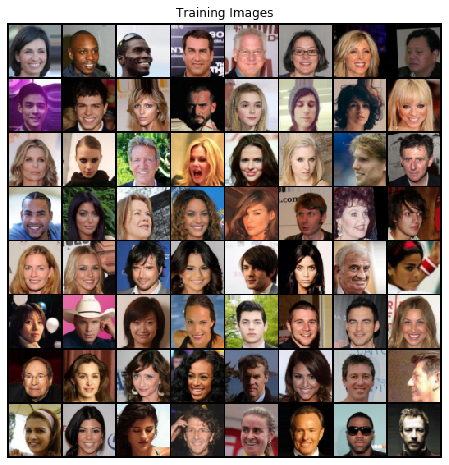

In [33]:
#We can use an image folder dataset the way we have it setup.
#Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
#Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

#Decide which device we want to run on
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")

#Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [34]:
#Custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### The two neural networks. In PyTorch a neural network could be a class. If implementing it as a class it inherits from nn.Module. The Generator gets a z latent vector as input with a 128 features and generates a 64 by 64 image. The Descriminator has an image as input and outputs if the image is real or not. The difference with a Linear GAN is that here the Discriminator uses Convolutional layers. The Generator uses Transposed Convolutional layers because to fool the Discriminator the model will generate the averaged image sample plus some noise for randomness. This creates the transposed version of the original image. 

In [35]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.convTr1 = nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias = False)
        self.batchNorm1 = nn.BatchNorm2d(ngf * 8)
        self.convTr2 = nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias = False)
        self.batchNorm2 = nn.BatchNorm2d(ngf * 4)
        self.convTr3 = nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias = False)
        self.batchNorm3 = nn.BatchNorm2d(ngf * 2)
        self.convTr4 = nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias = False)
        self.batchNorm4 = nn.BatchNorm2d(ngf)
        self.convTr5 = nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias = False)

    def forward(self, x):
        x = F.relu_(self.batchNorm1(self.convTr1(x)))
        x = F.relu_(self.batchNorm2(self.convTr2(x)))
        x = F.relu_(self.batchNorm3(self.convTr3(x)))
        x = F.relu_(self.batchNorm4(self.convTr4(x)))
        x = self.convTr5(x)
        
        return torch.tanh(x)
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(nc, ndf, 4, 2, 1, bias = False)
        self.conv2 = nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias = False)
        self.batchNorm1 = nn.BatchNorm2d(ngf * 2)
        self.conv3 = nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias = False)
        self.batchNorm2 = nn.BatchNorm2d(ngf * 4)
        self.conv4 = nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias = False)
        self.batchNorm3 = nn.BatchNorm2d(ngf * 8)
        self.conv5 = nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias = False)

    def forward(self, x):
        x = F.leaky_relu_(self.conv1(x), 0.2)
        x = F.leaky_relu_(self.batchNorm1(self.conv2(x)), 0.2)
        x = F.leaky_relu_(self.batchNorm2(self.conv3(x)), 0.2)
        x = F.leaky_relu_(self.batchNorm3(self.conv4(x)), 0.2)
        x = self.conv5(x)
        
        return torch.sigmoid(x)

#### Creating instances of the models and moving them to the device(in my case the gpu). If possible we can use multiple GPUs to have parallel calculations(not possible in my case). Set the weights of the models.

In [47]:
#Create the generator
netG = Generator().to(device)

#Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

#Apply the weights_init function to randomly initialize all weights
#to mean=0, stdev=0.2.
netG.apply(weights_init)

#Create the Discriminator
netD = Discriminator().to(device)

#Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
#Apply the weights_init function to randomly initialize all weights
#to mean=0, stdev=0.2.
netD.apply(weights_init);

#### Setting the optimisers and the loss function. The Discriminator has to decide if the image is real or not and its optimiser has to decrease the error probability. The Generator has to produce images that can fool the Discriminator and its optimiser has to increase the Discriminator's error probability. Ideally the Discriminator has to return 1 for real image and 0 for fake one. The Generator wants the output to always be 1 for it's fake images.

In [48]:
#Initialize BCELoss function
criterion = nn.BCELoss()

#Create batch of latent vectors that we will use to visualize
#the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

#Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

#Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr = lr, betas = (beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr = lr, betas = (beta1, 0.999))

In [67]:
#Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

#### If you want to load the image array with numpy and convert it to Tensors. Alos you can load the parameters of the models to continue training or to test the finished models.

In [50]:
#Load the current image array and split the channels
new_list = np.load("imgList.npy", allow_pickle = True)
img_list = []
for i in range(0, len(new_list.tolist()), 3):
    img_list.append(torch.Tensor((new_list[i], new_list[i + 1], new_list[i + 2])))
    
netG.load_state_dict(torch.load("dcGanGeneratorModel.pt"))
netD.load_state_dict(torch.load("dcGanDiscriminatorModel.pt"))

<All keys matched successfully>

### Training phase. On each EPOCH all the data is run through and the current statistics are printed. My dataset around 200000 images and it took 7 epochs to result in a relatively good image. I use the Celebraties Dataset. The training consists of the following steps. First we train the discriminator then the generator then we print some statistics. The Discriminator is trained by giving it first a real batch and then a fake batch. The loss is calculated and summed and backpropagation is applied. The Generator is trained by generating a batch and giving it to the Discriminator. Every 50 iterations statistics are princed for the loss. Every 500 iterations or 3 times per epoch we give the Generator fixed random noise because of the seed which we can use to check it's progress on the same output.

In [53]:
#For each epoch
for epoch in range(num_epochs):
    #For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        #Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        #Train with real batch
        netD.zero_grad()
        #Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.ones(b_size, device=device)
        #Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        #Calculate loss on real batch
        errD_real = criterion(output, label)
        #Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        #Train with fake batch
        #Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        #Generate fake image batch with G
        fake = netG(noise)
        label = torch.zeros(b_size, device=device)
        #Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        #Calculate D's loss on the fake batch
        errD_fake = criterion(output, label)
        #Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        #Add the gradients from the real and fake batches
        errD = errD_real + errD_fake
        #Update D
        optimizerD.step()

        #Update G network: maximize log(D(G(z)))
        netG.zero_grad()
        #Fake labels are real for Generator cost
        label = torch.ones(b_size, device=device)  
        #Since we just updated D, perform another forward pass of fake batch through D
        output = netD(fake).view(-1)
        #Calculate G's loss based on this output
        errG = criterion(output, label)
        #Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        #Update G
        optimizerG.step()
        
        #Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch + 1, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        #Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        #Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[1/5][0/1583]	Loss_D: 1.7044	Loss_G: 3.9056	D(x): 0.4119	D(G(z)): 0.4346 / 0.0297
[1/5][50/1583]	Loss_D: 0.1342	Loss_G: 19.2848	D(x): 0.9377	D(G(z)): 0.0000 / 0.0000
[1/5][100/1583]	Loss_D: 0.4361	Loss_G: 4.5913	D(x): 0.8037	D(G(z)): 0.0754 / 0.0153
[1/5][150/1583]	Loss_D: 0.4162	Loss_G: 4.9256	D(x): 0.7674	D(G(z)): 0.0232 / 0.0124
[1/5][200/1583]	Loss_D: 1.7307	Loss_G: 9.5652	D(x): 0.9452	D(G(z)): 0.7333 / 0.0005
[1/5][250/1583]	Loss_D: 0.4179	Loss_G: 4.9081	D(x): 0.8951	D(G(z)): 0.2139 / 0.0132
[1/5][300/1583]	Loss_D: 0.6086	Loss_G: 2.6353	D(x): 0.7686	D(G(z)): 0.2239 / 0.1238
[1/5][350/1583]	Loss_D: 0.3490	Loss_G: 3.1725	D(x): 0.8702	D(G(z)): 0.1635 / 0.0652
[1/5][400/1583]	Loss_D: 1.2806	Loss_G: 1.8482	D(x): 0.3937	D(G(z)): 0.0124 / 0.2242
[1/5][450/1583]	Loss_D: 1.9362	Loss_G: 9.1516	D(x): 0.9407	D(G(z)): 0.6967 / 0.0004
[1/5][500/1583]	Loss_D: 0.4055	Loss_G: 4.8819	D(x): 0.7779	D(G(z)): 0.0798 / 0.0217
[1/5][550/1583]	Loss_D: 0.4970	Loss_G: 4.5797	D(x): 

#### Loss graph of the generator compared to the discriminator

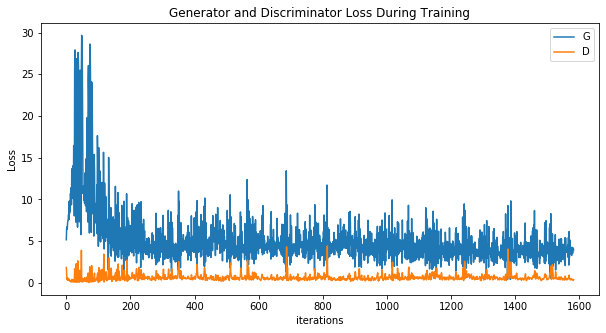

In [35]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

#### Each image grid is captured during the training and can show you how the quality of the generated images improves with each iteration. If you train the models for enough epochs you will see overfitting in action.

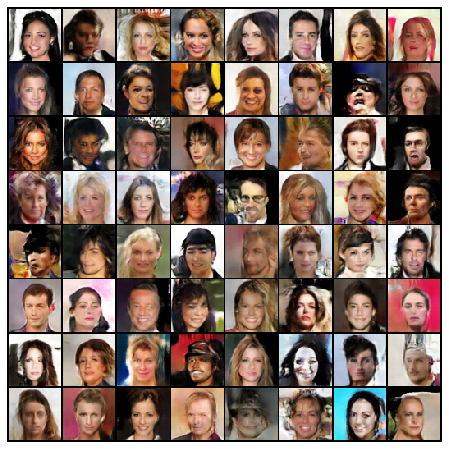

In [51]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

### After training we can save the models and load them in another program just for testing purposes to simplify the code.

In [54]:
torch.save(netG.state_dict(), "dcGanGeneratorModel.pt")
torch.save(netD.state_dict(), "dcGanDiscriminatorModel.pt")

### After training we can save the generated images as an numpy array so we can compare them again.

In [55]:
#Save the current collection of the images
new_list = torch.Tensor(13, 3, 530, 530)
torch.cat(img_list, out=new_list)
np.save("imgList.npy", new_list.numpy())

### Code to generate a new image with the Generator and save it. The image channels and normalized and merged.

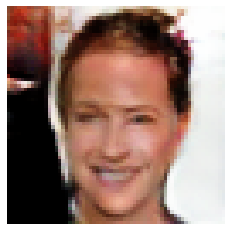

In [41]:
#Generate a new unique face
with torch.no_grad():
    test = torch.randn(128, 100, 1, 1, device = device)
    generated = netG(test)
    generated = generated.cpu()
    
    plt.imshow(np.transpose(vutils.make_grid(generated[0].to(device), padding=5, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.show()
    save_image(generated[0].view(3, 64, 64), "person.png", normalize = True)